# Preprocessing, clustering, and visualization of 10X CellRanger data

---


### Resetting this notebook

The clear out the notebook so you can run the code you need to select `Restart Kernel and Clear All Outputs` under the `Kernel` tab.

![restart notebook](images/restart_notebook.png)

---


In [1]:
import scanpy as sc
import pandas as pd
from matplotlib.pyplot import rc_context
import scipy
import anndata
import os
import warnings
warnings.filterwarnings("ignore")

In [2]:
%matplotlib inline
sc.set_figure_params(dpi=100, color_map = 'viridis_r')
sc.settings.verbosity = 3
sc.logging.print_header()

scanpy==1.9.4 anndata==0.9.2 umap==0.5.3 numpy==1.24.4 scipy==1.11.2 pandas==2.1.0 scikit-learn==1.3.0 statsmodels==0.14.0 igraph==0.10.6 pynndescent==0.5.10


In [3]:
# configuration for Code Ocean Capsule
from pathlib import Path

sc._settings.ScanpyConfig.cachedir = Path("/data/cache/")
sc._settings.ScanpyConfig.datasetdir = Path("/data/")
Path("/results/figures").mkdir(parents=True, exist_ok=True)
sc._settings.ScanpyConfig.figdir = Path("/results/figures")
Path("/results/write").mkdir(parents=True, exist_ok=True)
sc._settings.ScanpyConfig.writedir = Path("/results/write/")

In [4]:
results_dir = "/results"
results_file = (
    f"{results_dir}/write/INCF.h5ad"  # the file that will store the analysis results
)

### Load dataset

In [5]:
adata = sc.read_10x_mtx(
    '/data/INCF_10X_data/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading

... reading from cache file /data/cache/data-INCF_10X_data-matrix.h5ad


In [6]:
adata.var_names_make_unique()

normalizing counts per cell
    finished (0:00:00)


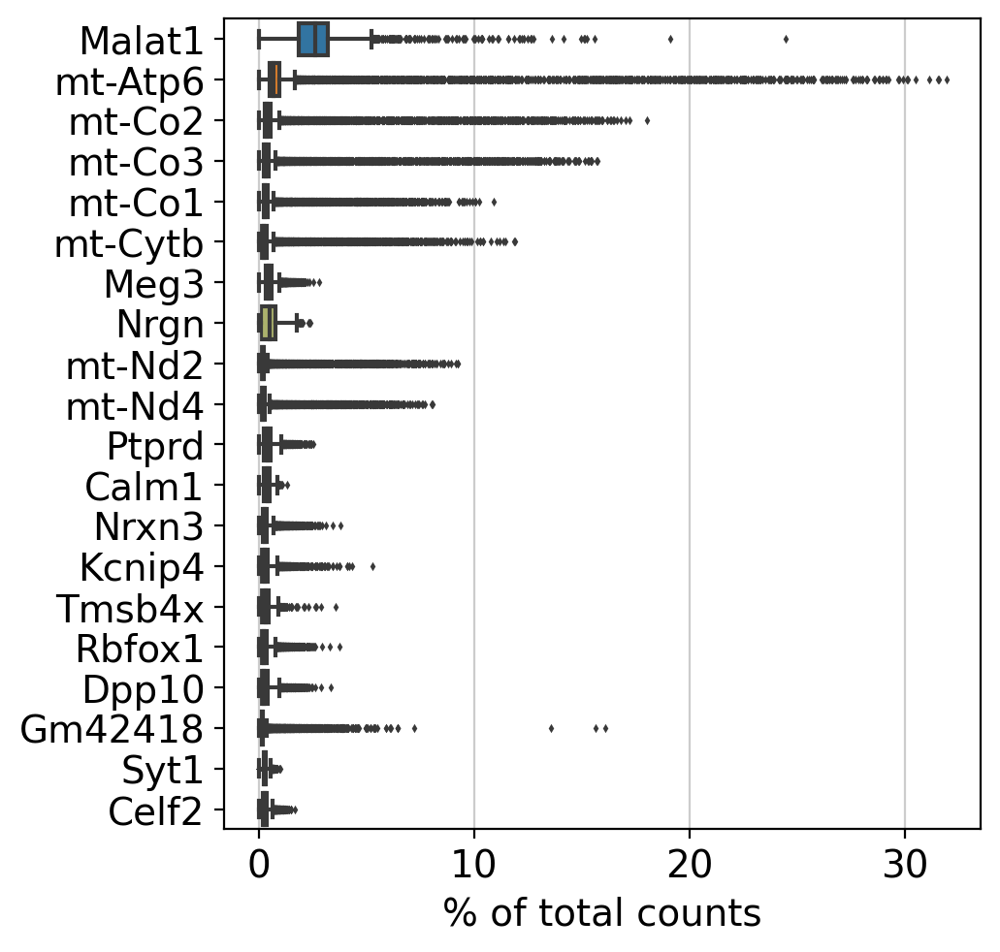

In [7]:
# Show those genes that yield the highest fraction of counts in each single cell, across all cells.

sc.pl.highest_expr_genes(
    adata,
    n_top=20,
)

In [8]:
# Basic Filtering

sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 156 cells that have less than 200 genes expressed
filtered out 10117 genes that are detected in less than 3 cells


In [9]:
adata.var["mt"] = adata.var_names.str.startswith(
    "mt-"
)  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)

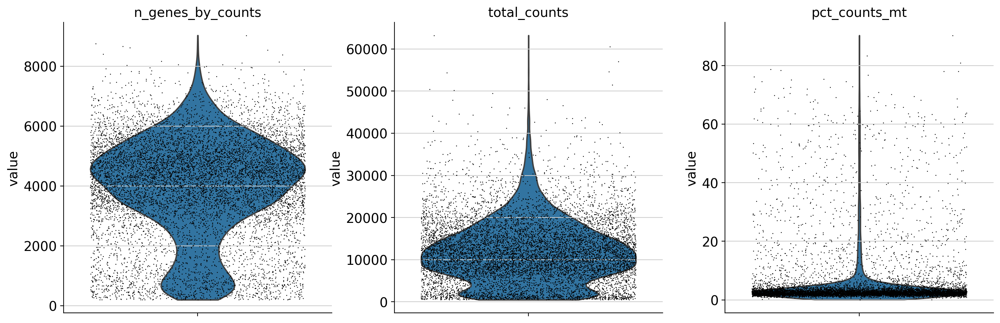

In [10]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

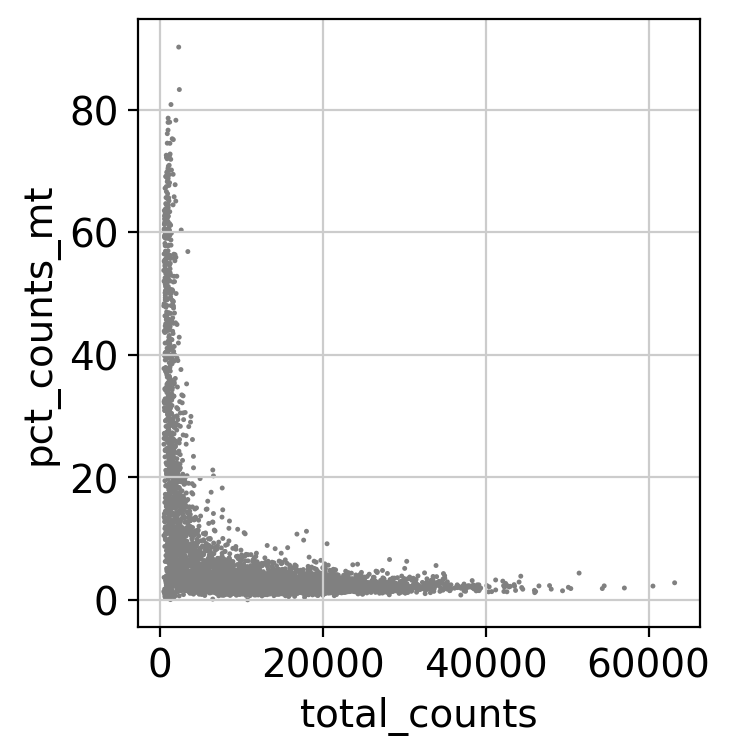

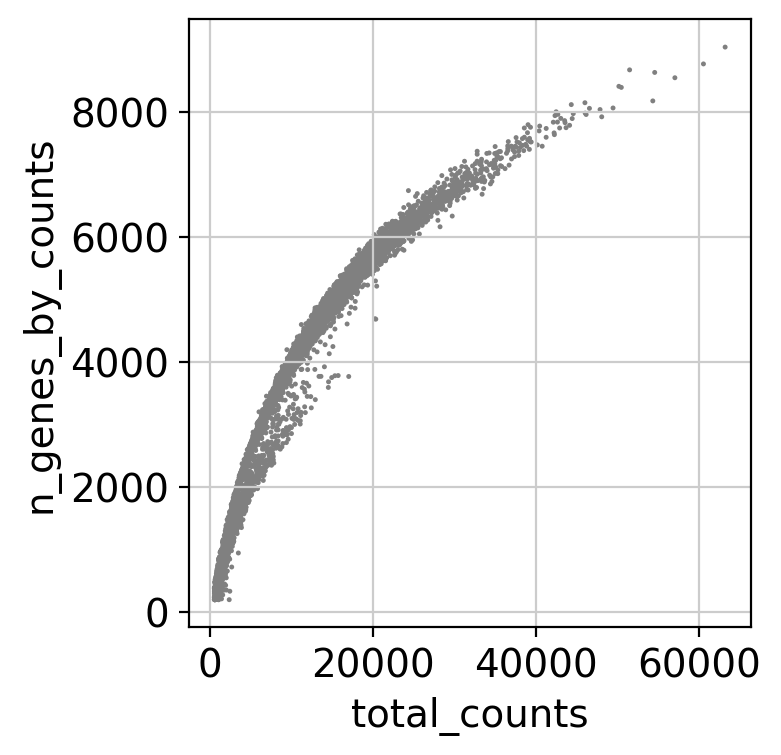

In [11]:
# Remove cells that have too many mitochondrial genes expressed or too many total counts:

sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts")

In [12]:
# Actually do the filtering

adata = adata[adata.obs.n_genes_by_counts < 2500, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [13]:
# Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells.

sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [14]:
# Logarithmize the data:

sc.pp.log1p(adata)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


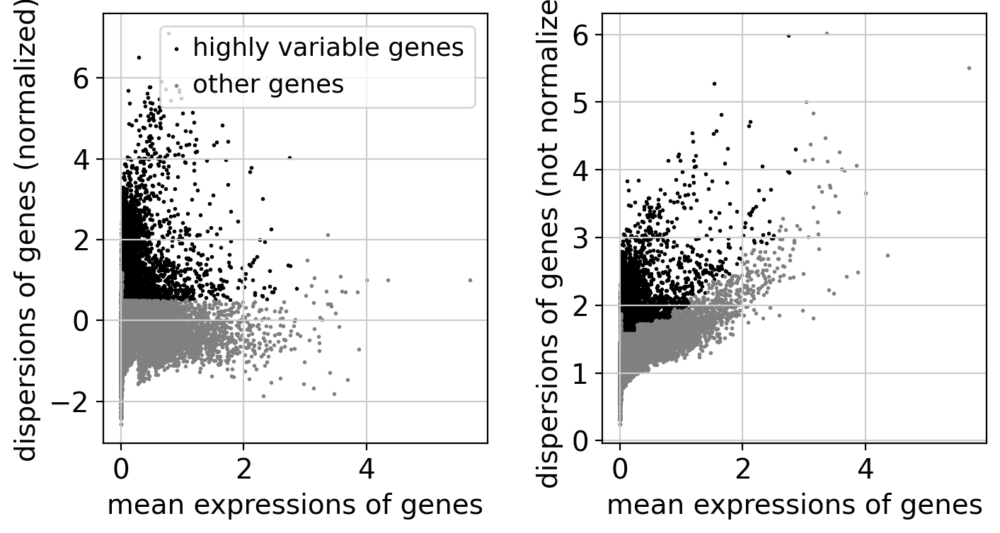

In [15]:
# Identify highly-variable genes.

sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

Set the `.raw` attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

In [16]:
adata.raw = adata

In [17]:
# Actually do the filtering

adata = adata[:, adata.var.highly_variable]

In [18]:
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt"])

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:07)


In [19]:
# Scale each gene to unit variance. Clip values exceeding standard deviation 10.

sc.pp.scale(adata, max_value=10)

## Principal component analysis

In [20]:
# Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

sc.tl.pca(adata, svd_solver="arpack")

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


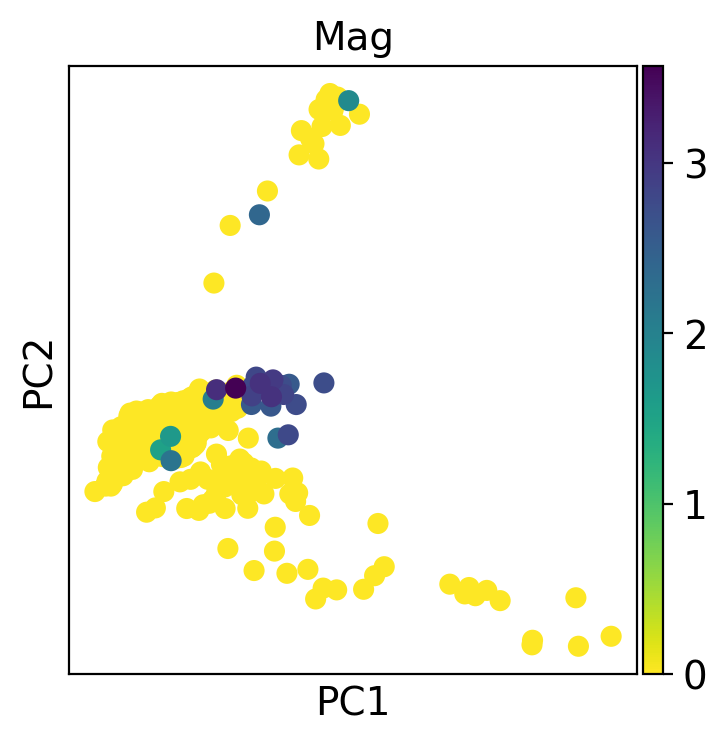

In [21]:
sc.pl.pca(adata, color='Mag')

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often a rough estimate of the number of PCs does fine.

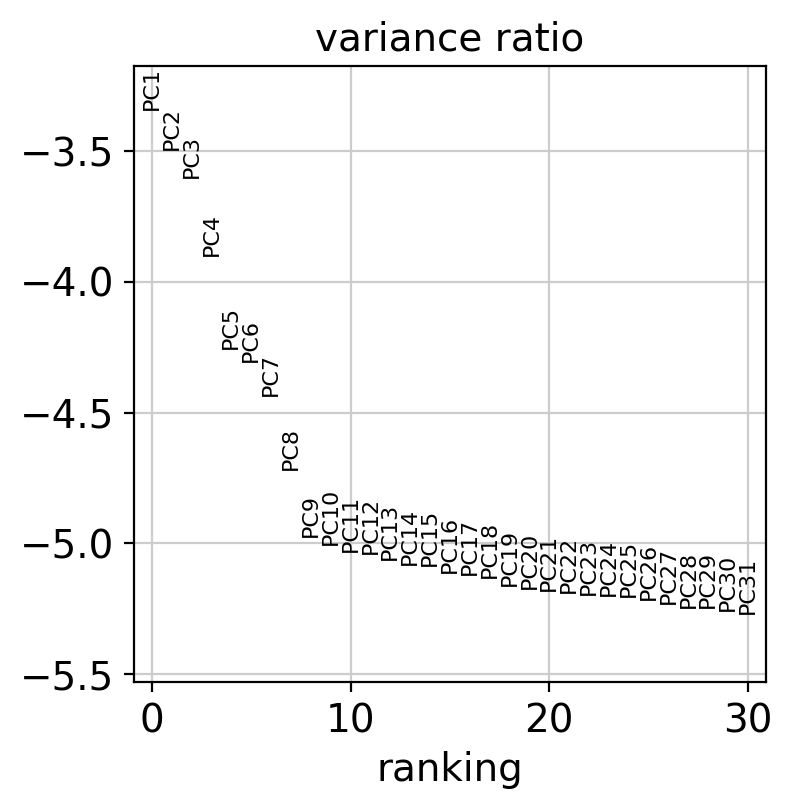

In [22]:
sc.pl.pca_variance_ratio(adata, log=True)

In [23]:
adata.write(results_file)

In [24]:
adata

AnnData object with n_obs × n_vars = 520 × 3978
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

In [25]:
# Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. 
# You might simply use default values here. For the sake of reproducing Seurat's results, let's take the following values.

sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


## Embedding the neighborhood graph

We suggest embedding the graph in two dimensions using UMAP ([McInnes et al., 2018](https://arxiv.org/abs/1802.03426)), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

```Python
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos="paga")
```

In [26]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


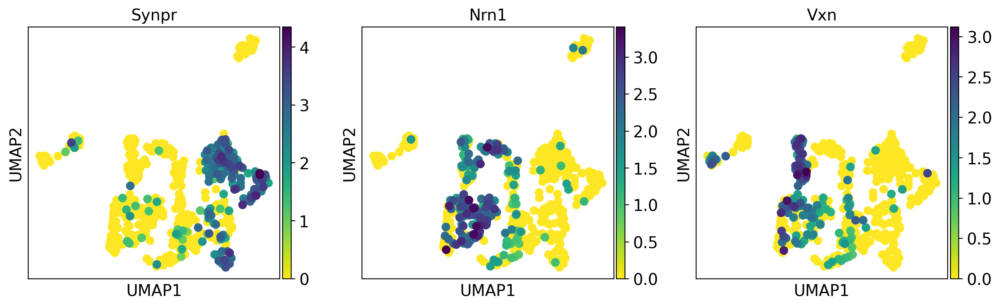

In [27]:
sc.pl.umap(adata, color=["Synpr", "Nrn1", "Vxn"])

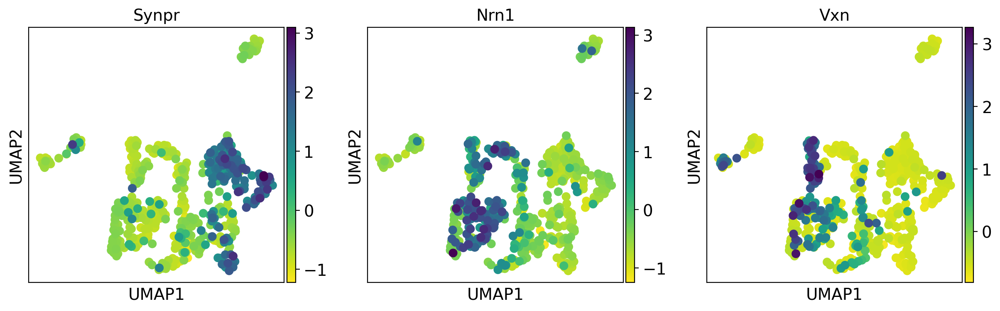

In [28]:
sc.pl.umap(adata, color=["Synpr", "Nrn1", "Vxn"], use_raw=False)

## Clustering the neighborhood graph

As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by [Traag *et al.* (2018)](https://scanpy.readthedocs.io/en/latest/references.html#traag18). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section. We will store the results with the name `clusters`.

In [29]:
sc.tl.leiden(adata, key_added="leiden")

running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


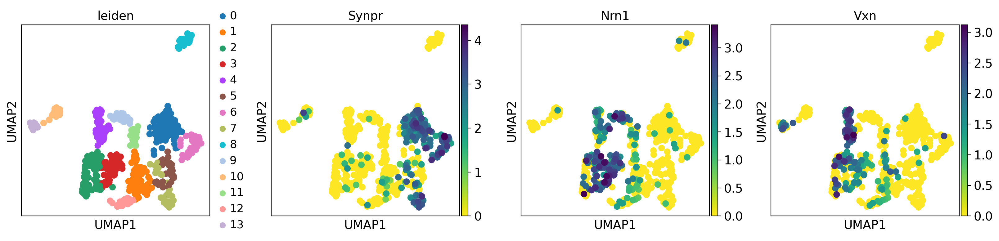

In [30]:
sc.pl.umap(adata, color=["leiden", "Synpr", "Nrn1", "Vxn"])

In [31]:
# Save the result

adata.write(results_file)

#### Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the `.raw` attribute of AnnData is used in case it has been initialized before. The simplest and fastest method to do so is the t-test.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


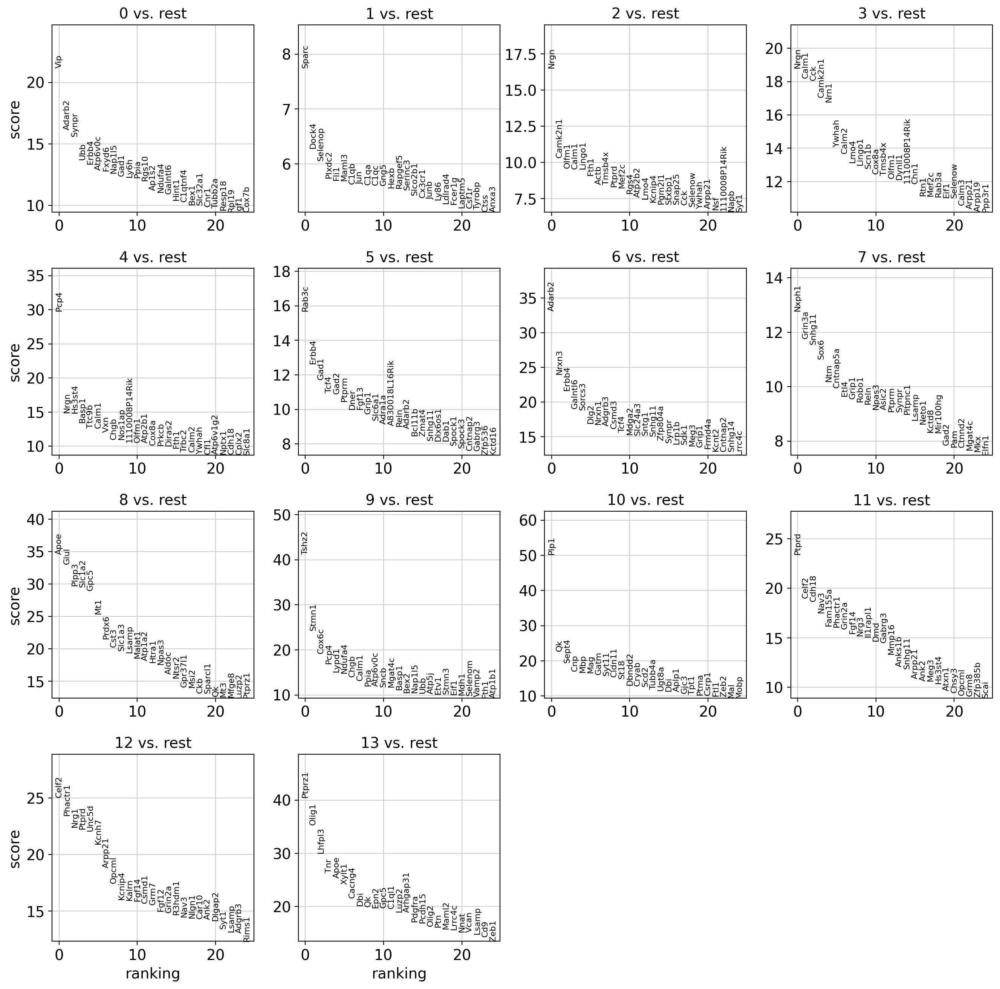

In [32]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

The result of a [Wilcoxon rank-sum (Mann-Whitney-U)](https://en.wikipedia.org/wiki/Mann%E2%80%93Whitney_U_test) test is very similar. We recommend using the latter in publications, see e.g., [Sonison & Robinson (2018)](https://doi.org/10.1038/nmeth.4612). You might also consider much more powerful differential testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


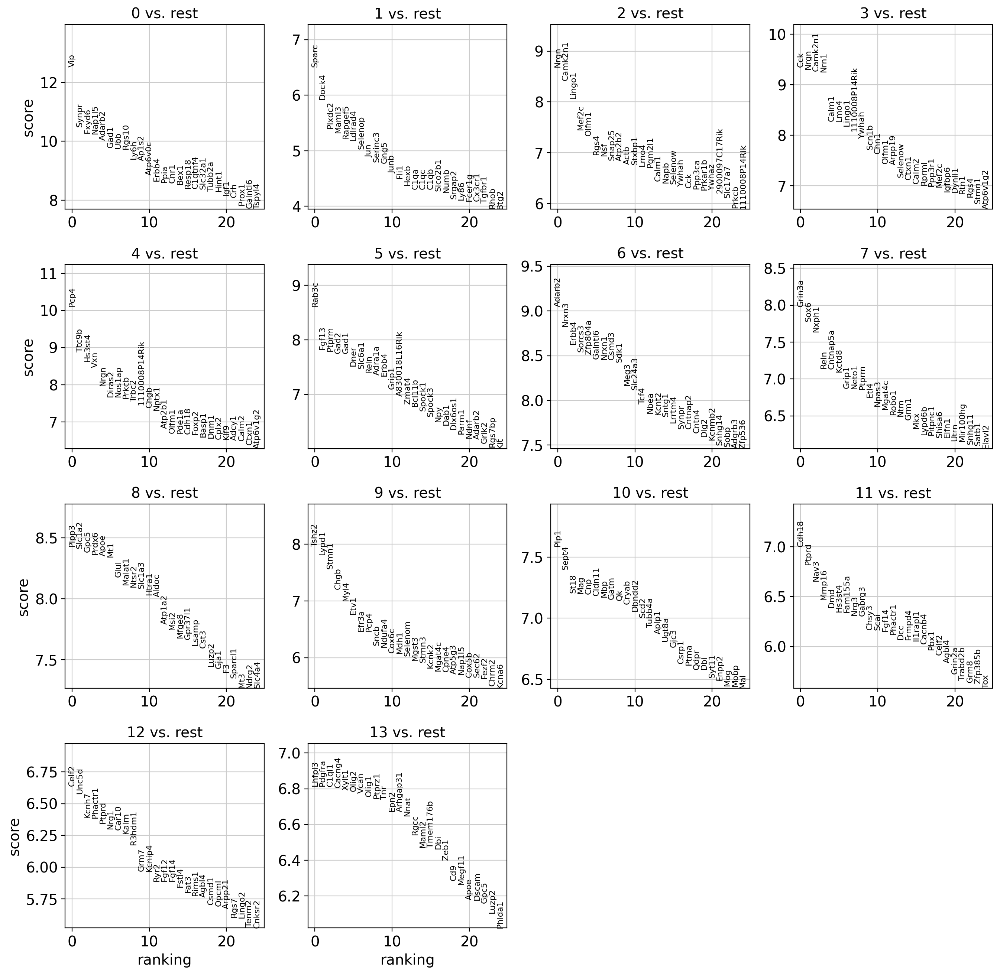

In [33]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [34]:
adata.write(results_file)

As an alternative, let us rank genes using logistic regression. For instance, this has been suggested by [Natranos et al. (2018)](https://doi.org/10.1101/258566). The essential difference is that here, we use a multi-variate appraoch whereas conventional differential tests are uni-variate. [Clark et al. (2014)](https://doi.org/10.1186/1471-2105-15-79) has more details.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:01:04)


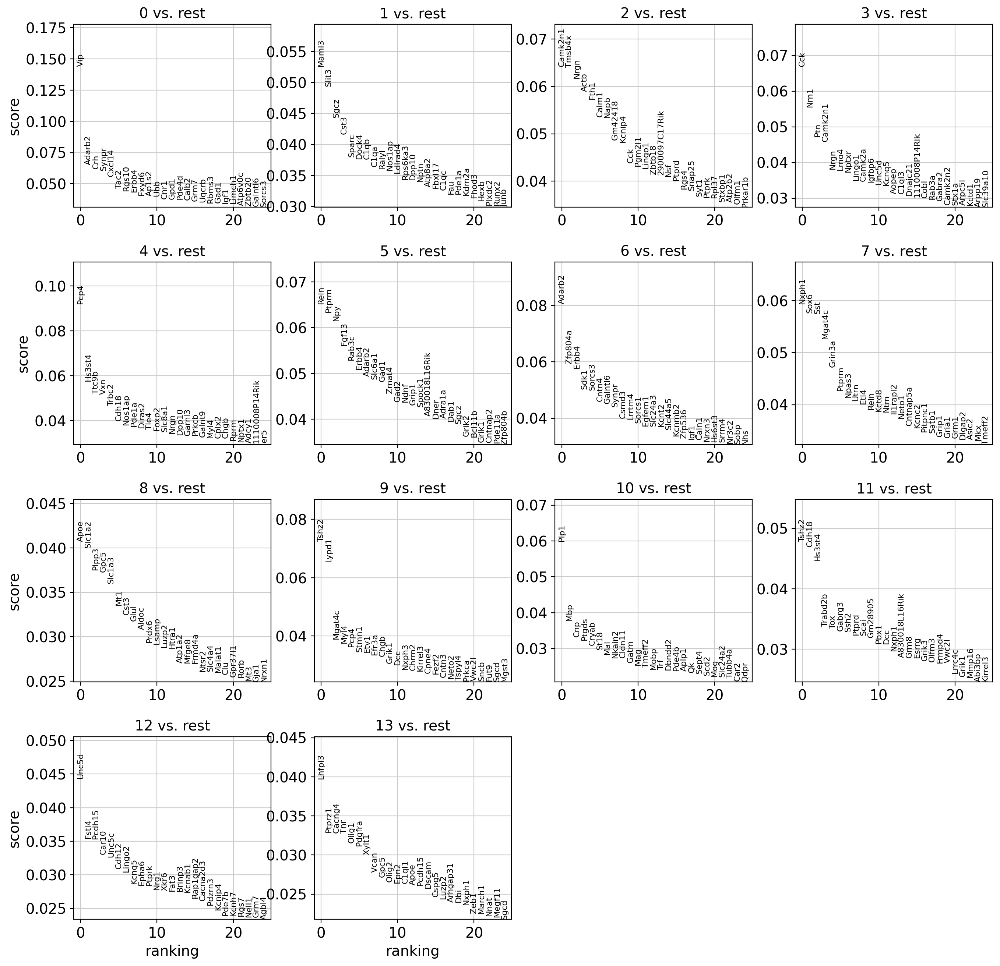

In [35]:
sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [36]:
# Reload the object that has been save with the Wilcoxon Rank-Sum test result.

adata = sc.read(results_file)

In [37]:
# Show the 15 top ranked genes per cluster 0, 1, ..., 14 in a dataframe.

pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(14)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,Vip,Sparc,Nrgn,Cck,Pcp4,Rab3c,Adarb2,Grin3a,Plpp3,Tshz2,Plp1,Cdh18,Celf2,Lhfpl3
1,Synpr,Dock4,Camk2n1,Nrgn,Ttc9b,Fgf13,Nrxn3,Sox6,Slc1a2,Lypd1,Sept4,Ptprd,Unc5d,Pdgfra
2,Fxyd6,Plxdc2,Lingo1,Camk2n1,Hs3st4,Ptprm,Erbb4,Nxph1,Gpc5,Stmn1,St18,Nav3,Kcnh7,C1ql1
3,Nap1l5,Maml3,Mef2c,Nrn1,Vxn,Gad2,Sorcs3,Reln,Prdx6,Chgb,Mag,Mmp16,Phactr1,Cacng4
4,Adarb2,Rapgef5,Olfm1,Calm1,Nrgn,Gad1,Zfp804a,Cntnap5a,Apoe,Myl4,Cnp,Dmd,Ptprd,Xylt1
5,Gad1,Ldlrad4,Rgs4,Lmo4,Diras2,Dner,Galntl6,Kctd8,Mt1,Etv1,Cldn11,Hs3st4,Nrg1,Olig2
6,Ubb,Selenop,Nsf,Lingo1,Nos1ap,Slc6a1,Nrxn1,Grip1,Glul,Efr3a,Mbp,Fam155a,Car10,Vcan
7,Rgs10,Jun,Snap25,1110008P14Rik,Prkcb,Reln,Csmd3,Neto1,Malat1,Pcp4,Gatm,Nrg3,Kalrn,Olig1
8,Ly6h,Serinc3,Atp2b2,Ywhah,Trbc2,Adra1a,Sdk1,Ptprm,Ntsr2,Sncb,Qk,Gabrg3,R3hdm1,Ptprz1
9,Ap1s2,Gng5,Actb,Scn1b,1110008P14Rik,Erbb4,Meg3,Etl4,Slc1a3,Ndufa4,Cryab,Chsy3,Grm7,Tnr


In [38]:
adata

AnnData object with n_obs × n_vars = 520 × 3978
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [39]:
# Get a table with the scores and groups.

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
pd.DataFrame(
    {
        group + "_" + key[:1]: result[key][group]
        for group in groups
        for key in ["names", "pvals"]
    }
).head(14)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,9_n,9_p,10_n,10_p,11_n,11_p,12_n,12_p,13_n,13_p
0,Vip,6.514831e-36,Sparc,7.881292e-11,Nrgn,3.853667e-18,Cck,8.851389e-21,Pcp4,5.833576e-24,...,Tshz2,1.750155e-15,Plp1,3.319309e-14,Cdh18,2.492240e-12,Celf2,3.182680e-11,Lhfpl3,9.476753e-12
1,Synpr,9.424713e-26,Dock4,3.231317e-09,Camk2n1,3.664091e-17,Nrgn,1.367717e-20,Ttc9b,6.463312e-19,...,Lypd1,5.544086e-15,Sept4,1.392658e-13,Ptprd,9.092317e-12,Unc5d,4.849156e-11,Pdgfra,9.476753e-12
2,Fxyd6,9.034092e-25,Plxdc2,6.680327e-08,Lingo1,7.247341e-16,Camk2n1,1.902256e-20,Hs3st4,6.933929e-18,...,Stmn1,3.860274e-14,St18,5.770217e-13,Nav3,2.857286e-11,Kcnh7,1.667361e-10,C1ql1,9.588793e-12
3,Nap1l5,1.209267e-24,Maml3,1.020965e-07,Mef2c,9.562625e-14,Nrn1,2.119328e-20,Vxn,2.658224e-17,...,Chgb,5.939135e-13,Mag,5.966239e-13,Mmp16,9.889061e-11,Phactr1,1.712686e-10,Cacng4,1.005007e-11
4,Adarb2,1.109146e-23,Rapgef5,1.866668e-07,Olfm1,2.220621e-13,Calm1,1.288986e-16,Nrgn,1.571613e-15,...,Myl4,2.594725e-12,Cnp,6.272588e-13,Dmd,1.632841e-10,Ptprd,2.237514e-10,Xylt1,1.116889e-11
5,Gad1,1.278323e-22,Ldlrad4,2.207185e-07,Rgs4,3.463927e-12,Lmo4,1.335159e-16,Diras2,1.717247e-14,...,Etv1,1.424780e-11,Cldn11,6.742528e-13,Hs3st4,2.202272e-10,Nrg1,2.980832e-10,Olig2,1.156827e-11
6,Ubb,1.950432e-22,Selenop,5.052742e-07,Nsf,3.964489e-12,Lingo1,2.748497e-16,Nos1ap,1.724432e-14,...,Efr3a,1.038980e-10,Mbp,7.368556e-13,Fam155a,2.258607e-10,Car10,3.142786e-10,Vcan,1.240944e-11
7,Rgs10,2.108744e-22,Jun,1.071656e-06,Snap25,7.478680e-12,1110008P14Rik,6.501381e-16,Prkcb,2.337149e-14,...,Pcp4,1.068025e-10,Gatm,8.462639e-13,Nrg3,2.762909e-10,Kalrn,3.800111e-10,Olig1,1.410996e-11
8,Ly6h,5.874049e-21,Serinc3,1.620555e-06,Atp2b2,8.328595e-12,Ywhah,2.037965e-15,Trbc2,4.620894e-14,...,Sncb,5.133712e-10,Qk,9.093045e-13,Gabrg3,2.905252e-10,R3hdm1,6.614647e-10,Ptprz1,1.530880e-11
9,Ap1s2,1.008610e-20,Gng5,1.836229e-06,Actb,1.266080e-11,Scn1b,1.213661e-14,1110008P14Rik,9.327653e-14,...,Ndufa4,6.235493e-10,Cryab,1.133600e-12,Chsy3,6.999998e-10,Grm7,2.434581e-09,Tnr,1.585262e-11


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


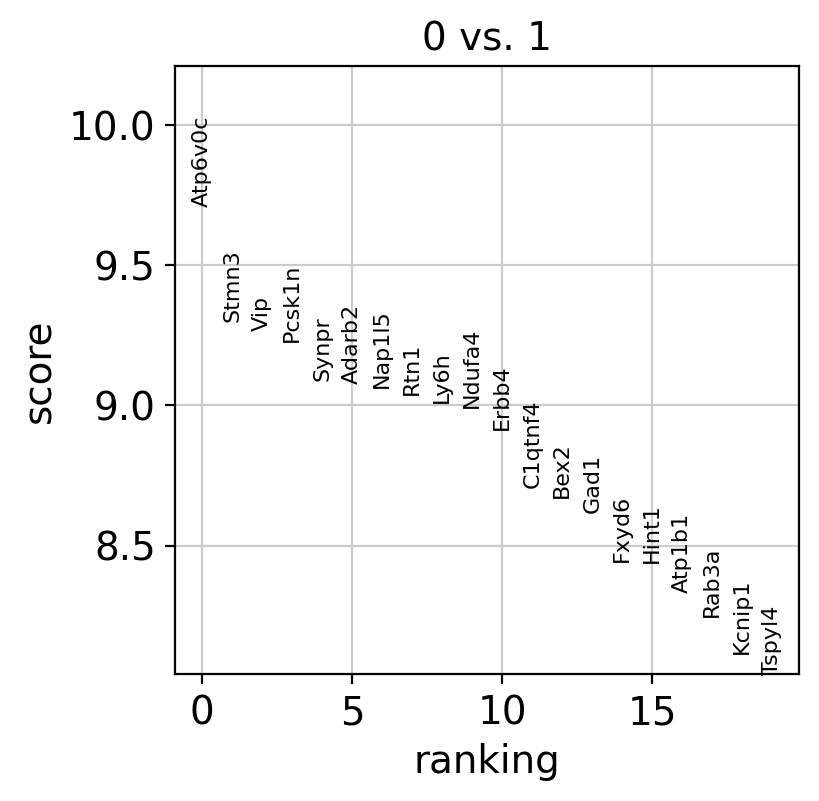

In [40]:
# Compare to a single cluster:

sc.tl.rank_genes_groups(adata, "leiden", groups=["0"], reference="1", method="wilcoxon")
sc.pl.rank_genes_groups(adata, groups=["0"], n_genes=20)

If we want a more detailed view for a certain group, use `sc.pl.rank_genes_groups_violin`.

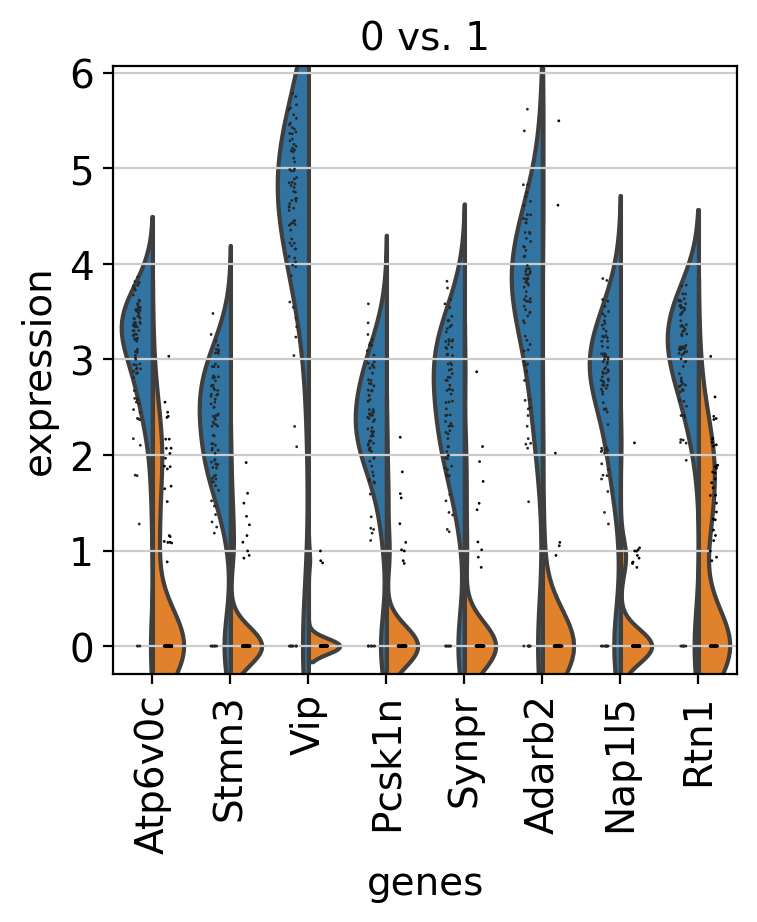

In [41]:
sc.pl.rank_genes_groups_violin(adata, groups="0", n_genes=8)

In [42]:
# Reload the object with the computed differential expression (i.e. DE via a comparison with the rest of the groups):

adata = sc.read(results_file)

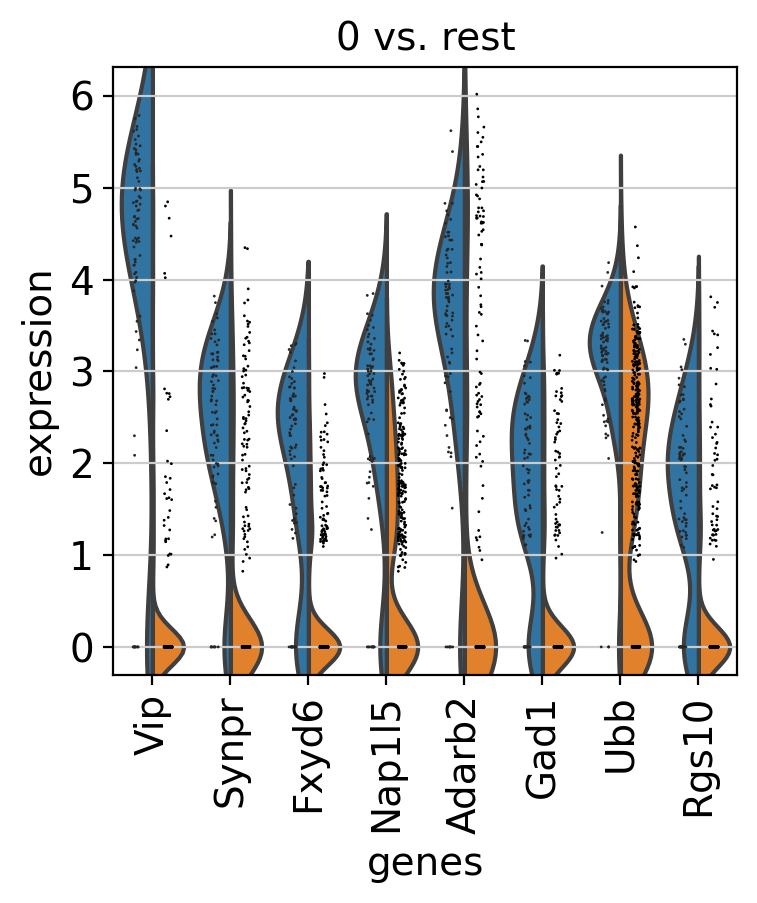

In [43]:
sc.pl.rank_genes_groups_violin(adata, groups="0", n_genes=8)

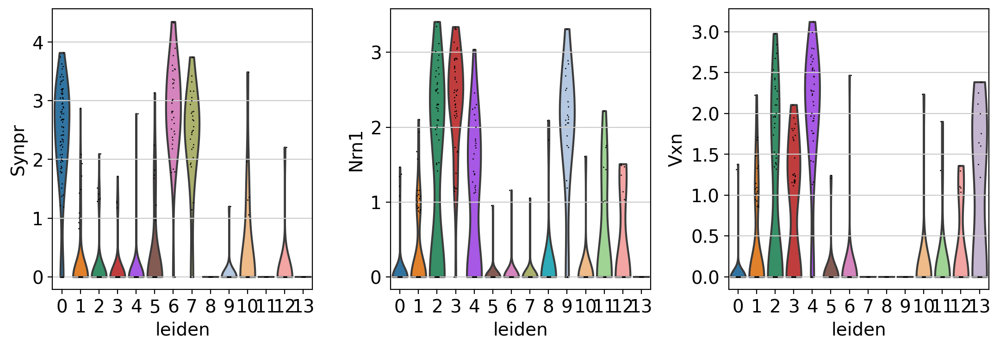

In [44]:
# If you want to compare a certain gene across groups, use the following.

sc.pl.violin(adata, ["Synpr", "Nrn1", "Vxn"], groupby="leiden")

# Visualization 

---

### Visualization of gene expression and other variables

For the scatter plots, the value to plot is given as the `color` argument. This can be any gene or any column in `.obs`, where `.obs` is a DataFrame containing the annotations per observation/cell, see [AnnData](https://anndata.readthedocs.io/en/stable/) for more information.

In [45]:
adata

AnnData object with n_obs × n_vars = 520 × 3978
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

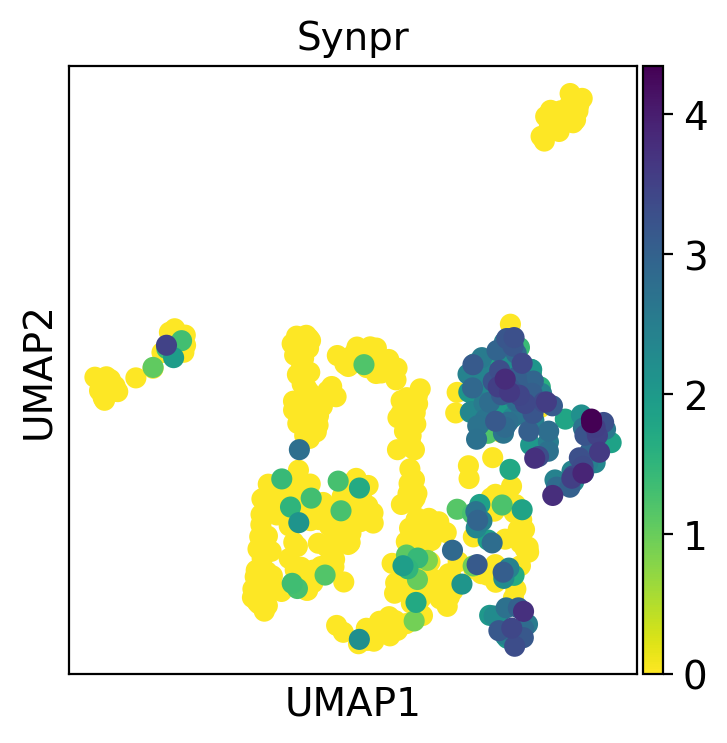

In [46]:
# rc_context is used for the figure size, in this case 4x4
with rc_context({'figure.figsize': (4, 4)}):
    sc.pl.umap(adata, color='Synpr')

Multiple values can be given to `color`. In the following example we will plot 6 genes: "Synpr", "Nrn1", "Vxn", "Bcl11b", "Kcnt2", and "Ntm".

Also, we will plot two other values: `total_counts` which is the number of UMI counts per cell (stored in `.obs`), and `bulk_labels` which is a categorical value containing the original labelling of the cells from 10X.

Also, we are using `frameon=False` to remove the boxes around the plots and `s=50` to set the dot size.



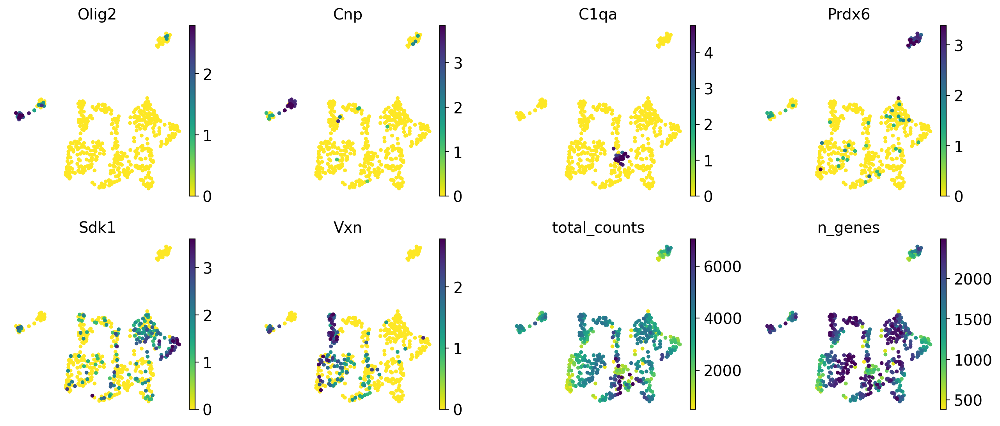

In [47]:
with rc_context({"figure.figsize": (3, 3)}):
    sc.pl.umap(
        adata,
        color=[
            "Olig2",
            "Cnp",
            "C1qa",
            "Prdx6",
            "Sdk1",
            "Vxn",
            "total_counts",
            "n_genes",
        ],
        s=50,
        frameon=False,
        ncols=4,
        vmax="p99",
    )

In [48]:
# compute clusters using the leiden method with resolution 0.5 and store the results with the name `clusters`
sc.tl.leiden(adata, key_added="clusters", resolution=0.5)

running Leiden clustering
    finished: found 10 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


In this plot we can see the groups of cells that cluster according to leiden clustering.

The functions for scatterplots have many options that allow fine tuning of the images. For example, we can look at the clustering as follows:

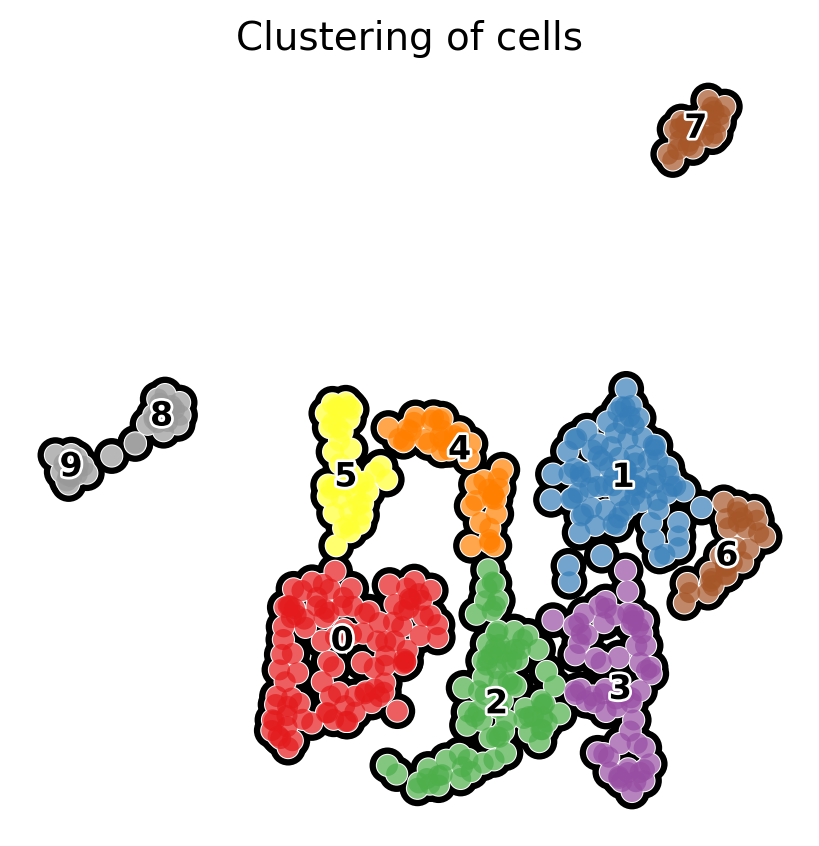

In [49]:
with rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(
        adata,
        color="clusters",
        add_outline=True,
        legend_loc="on data",
        legend_fontsize=12,
        legend_fontoutline=2,
        frameon=False,
        title="Clustering of cells",
        palette="Set1",
    )

## Mark clusters of interest

Frequently, clusters need to be labelled using well known marker genes. Using scatter plots we can see the expression of a gene and perhaps associate it with a cluster. Here, we will show other visual ways to associate marker genes to clusters using *dotplots*, *violin plots*, *heatmaps* and something that we call '*tracksplot*'. All of these visualizations summarize the same information, expression split by cluster, and the selection of the best results is left to the investigator do decide.
 
Marker genes can be associated with cell types. In this example we will merely identify some subset of clusters as clusters of interest.
 
First, we set up a dictionary with the clustered genes associated, as this will allow scanpy to automatically label the groups of genes:


In [50]:
cluster_dict = {
    "Cluster1": ["Olig2", "Rgcc", "Nnat", "Cacng4", "Vcan", "Olig1"],
    "Cluster2": ["Cnp", "Cldn11", "Aplp1", "Mag", "Mbp", "Gatm"],
    "Cluster3": ["C1qa", "Junb", "Jun", "Selenop", "Serinc3"],
    "Cluster4": ["Prdx6", "Apoe", "Mt1", "Glul"],
    "Cluster5": ["Sdk1", "Adarb2", "Zfp804a"],
    "Cluster6": ["Vxn", "Trbc2"],
}

## Dotplot

A quick way to check the expression of these genes per cluster is to using a dotplot. This type of plot summarizes two types of information: the color represents the mean expression within each of the categories (in this case in each cluster) and the dot size indicates the fraction of cells in the categories expressing a gene. 

Also, it is also useful to add a dendrogram to the graph to bring together similar clusters. The hierarchical clustering is computed automatically using the correlation of the PCA components between the clusters.

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: 0, 1, 2, etc.
var_group_labels: Cluster1, Cluster2, Cluster3, etc.


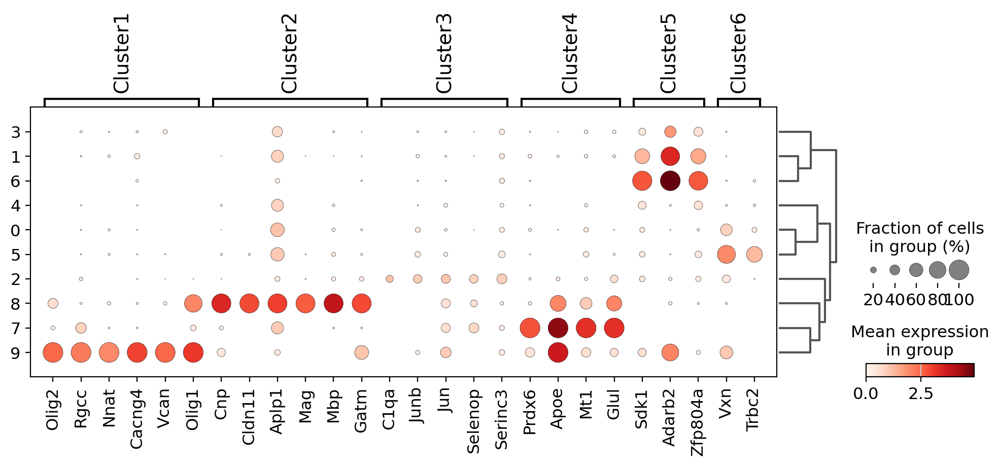

In [51]:
sc.pl.dotplot(adata, cluster_dict, "clusters", dendrogram=True)

If our numbered clusters were instead, for example, cell types, it would be easy to associate computed clusters with cell types.
This information can be used to manually annotate the cells as follows:

In [52]:
# Create a dictionary to map cluster to annotation label. Using different data, the annotation label could have been a Cell Type instead of a randomly assigned cluster number.
cluster2annotation = {
    "0": "Cluster1",
    "1": "Cluster2",
    "2": "Cluster3",
    "3": "Cluster4",
    "4": "Cluster5",
    "5": "Cluster6",
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata.obs["clustered"] = adata.obs["clusters"].map(cluster2annotation).astype("category")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clustered']`


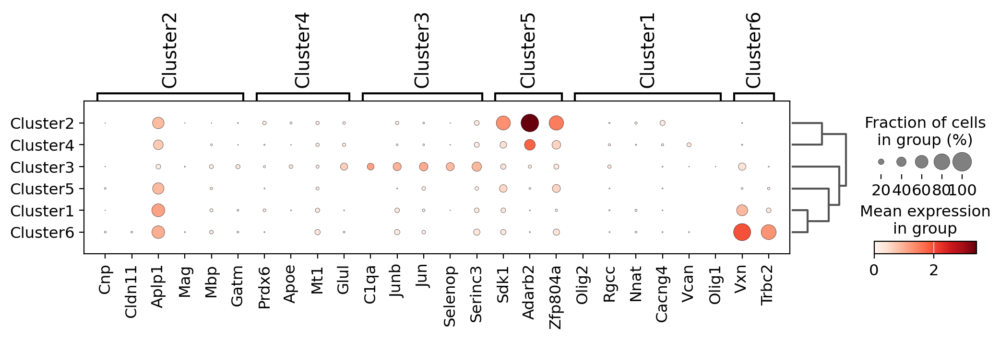

In [53]:
sc.pl.dotplot(adata, cluster_dict, "clustered", dendrogram=True)

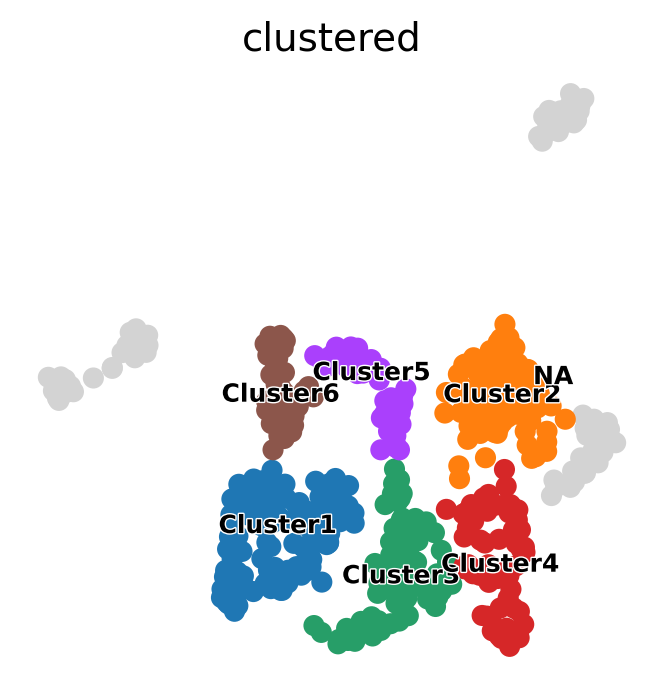

In [54]:
sc.pl.umap(
    adata,
    color="clustered",
    legend_loc="on data",
    frameon=False,
    legend_fontsize=9,
    legend_fontoutline=1,
)

# Violin plot

A different way to explore the markers is with violin plots. Here we can see the expression of *Adarb2* in clusters 2 and 7, and *Vxn* in cluster 6. Compared to a dotplot, the violin plot gives us an idea of the distribution of gene expression values across cells.

In [55]:
adata

AnnData object with n_obs × n_vars = 520 × 3978
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'clustered'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'clusters_colors', 'dendrogram_clusters', 'dendrogram_clustered', 'clustered_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

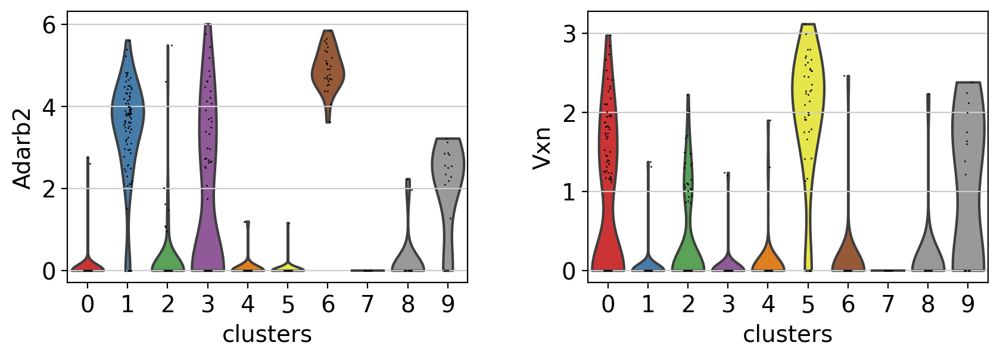

In [56]:
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(adata, ["Adarb2", "Vxn"], groupby="clusters")

**Note** Violin plots can also be used to plot any numerical value stored in `.obs`. For example, here violin plots are used to compare the number of genes and the percentage of mitochondrial genes between the different clusters. 

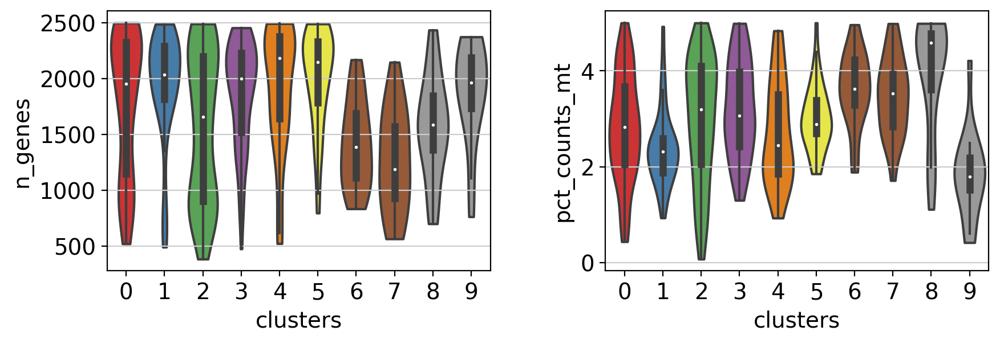

In [57]:
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(
        adata,
        ["n_genes", "pct_counts_mt"],
        groupby="clusters",
        stripplot=False,
        inner="box",
    )  # use stripplot=False to remove the internal dots, inner='box' adds a boxplot inside violins

### Stacked-violin plot

To simultaneously look at the violin plots for all marker genes we use `sc.pl.stacked_violin`. As previously, a dendrogram was added to group similar clusters

categories: 0, 1, 2, etc.
var_group_labels: Cluster1, Cluster2, Cluster3, etc.


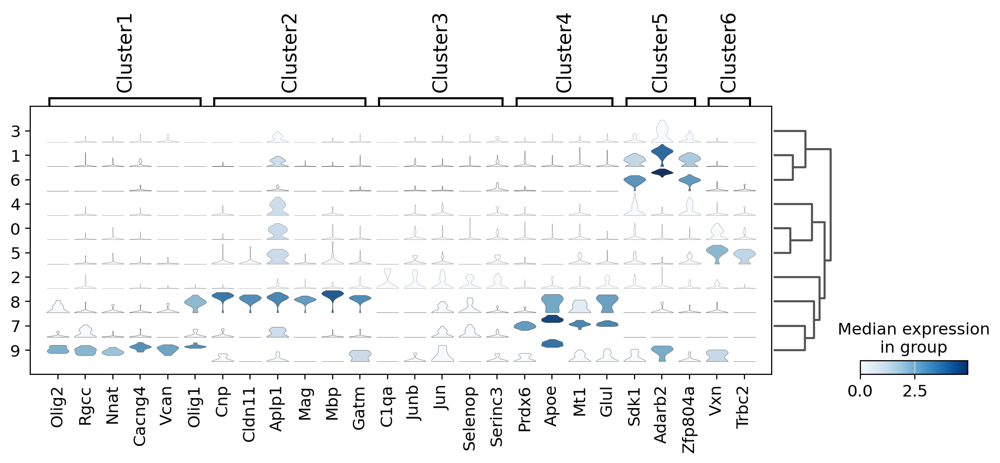

In [58]:
ax = sc.pl.stacked_violin(
    adata, cluster_dict, groupby="clusters", swap_axes=False, dendrogram=True
)

# Matrixplot

A simple way to visualize the expression of genes is with a `matrix plot`. This is a heatmap of the mean expression values per gene grouped by categories. This type plot basically shows the same information as the color in the dotplots.

Here, scale the expression of the genes from 0 to 1, being the maximum mean expression and 0 the minimum.

categories: 0, 1, 2, etc.
var_group_labels: Cluster1, Cluster2, Cluster3, etc.


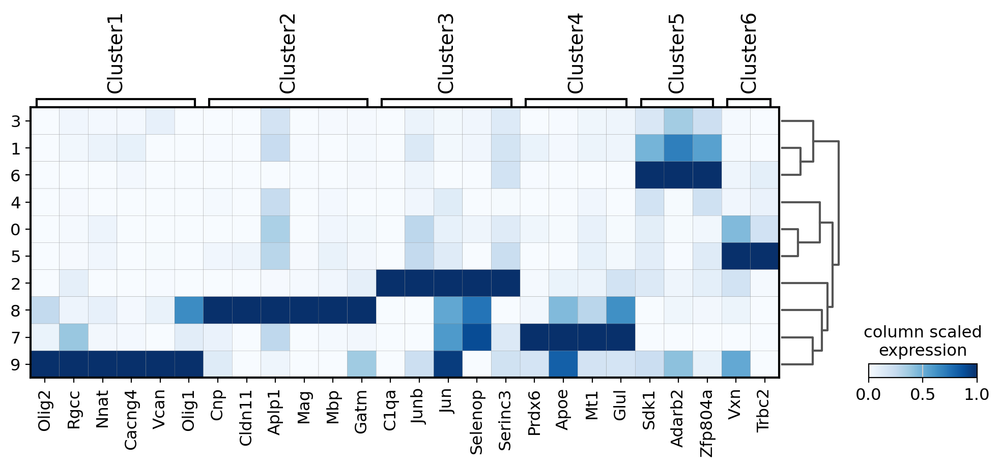

In [59]:
sc.pl.matrixplot(
    adata,
    cluster_dict,
    "clusters",
    dendrogram=True,
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
)

## Combining plots in subplots

An `axis` can be passed to a plot to combine multiple outputs as in the following example

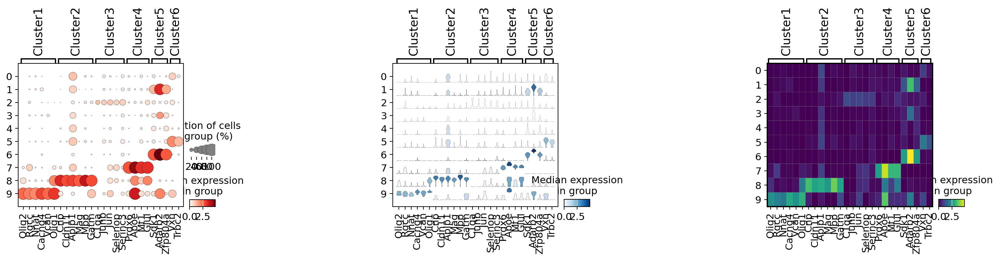

In [60]:
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 4), gridspec_kw={"wspace": 0.9})

ax1_dict = sc.pl.dotplot(
    adata, cluster_dict, groupby="clusters", ax=ax1, show=False
)
ax2_dict = sc.pl.stacked_violin(
    adata, cluster_dict, groupby="clusters", ax=ax2, show=False
)
ax3_dict = sc.pl.matrixplot(
    adata, cluster_dict, groupby="clusters", ax=ax3, show=False, cmap="viridis"
)

# Heatmaps

Heatmaps do not collapse cells as in previous plots. Instead, each cells is shown in a row (or column if `swap_axes=True`). The groupby information can be added and is shown using the same color code found for `sc.pl.umap` or any other embedding.

categories: 0, 1, 2, etc.
var_group_labels: Cluster1, Cluster2, Cluster3, etc.


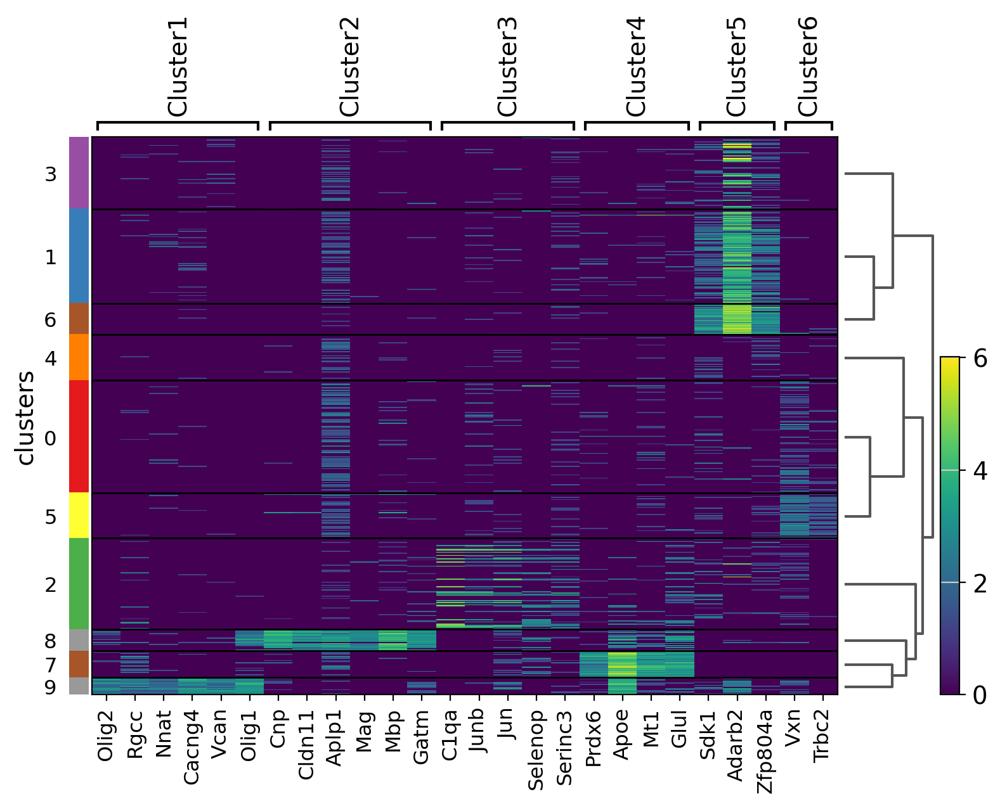

In [61]:
ax = sc.pl.heatmap(
    adata, cluster_dict, groupby="clusters", cmap="viridis", dendrogram=True
)

# Tracksplot

The track plot shows the same information as the heatmap, but, instead of a color scale, the gene expression is represented by height.

categories: 0, 1, 2, etc.
var_group_labels: Cluster1, Cluster2, Cluster3, etc.


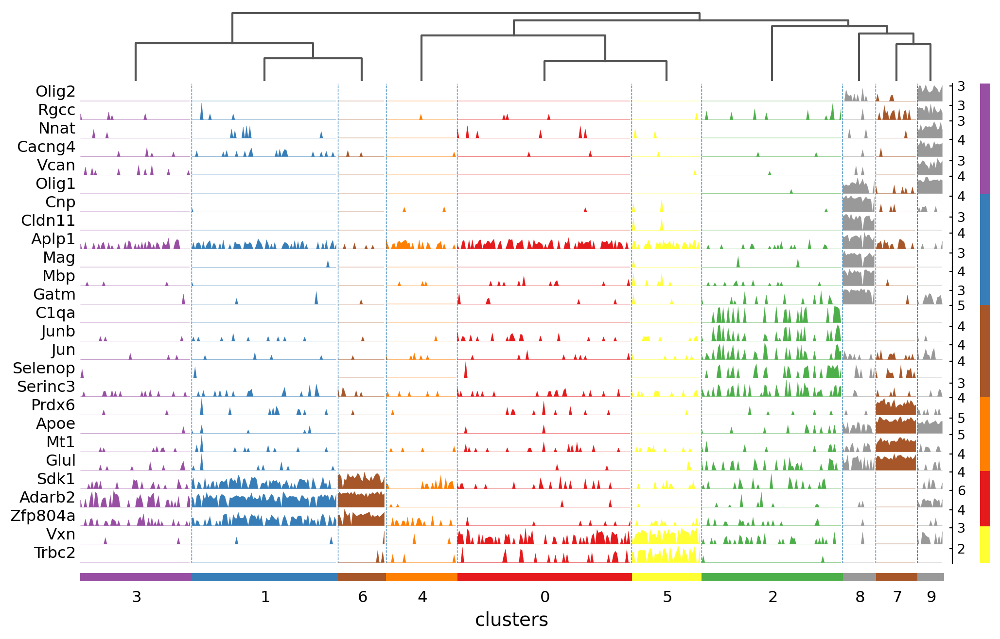

In [62]:
ax = sc.pl.tracksplot(adata, cluster_dict, groupby="clusters", dendrogram=True)

## Visualization of marker genes

Instead of characterizing clusters by known gene markers as previously, we can identify genes that are differentially expressed in the clusters or groups.

To identify differentially expressed genes we run `sc.tl.rank_genes_groups`. This function will take each group of cells and compare the distribution of each gene in a group against the distribution in all other cells not in the group.

In [63]:
sc.tl.rank_genes_groups(adata, groupby="clusters", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


### Visualize marker genes using dotplot

The dotplot visualization is useful to get an overview of the genes that show differential expression. To make the resulting image more compact we will use `n_genes=4` to show only the top 4 scoring genes.

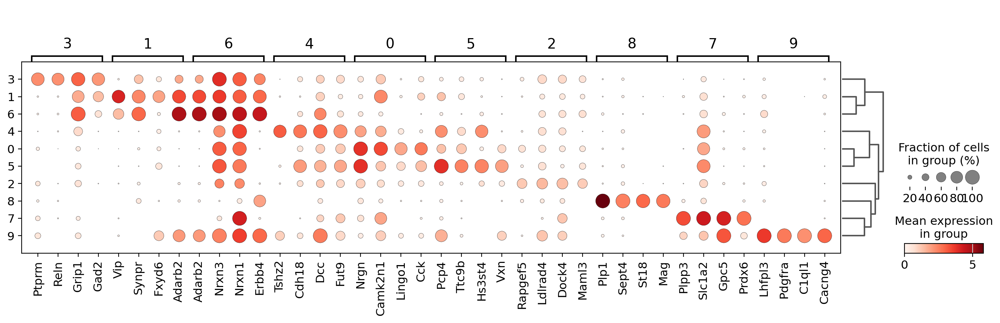

In [64]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4)

In order to get a better representation we can plot *log fold changes* instead of gene expression. Also, we want to focus on genes that have a log fold change >= 3 between the cell type expression and the rest of cells. 

In this case we set `values_to_plot='logfoldchanges'` and `min_logfoldchange=3`.

Because log fold change is a divergent scale we also adjust the min and max to be plotted and use a divergent color map.

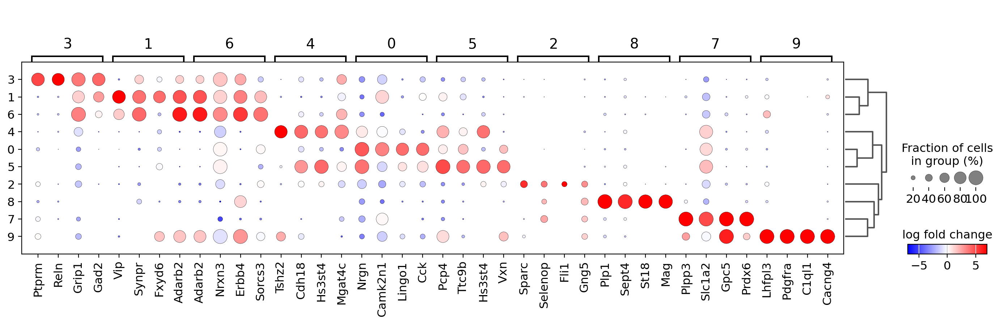

In [65]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=4,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",
)

#### Focusing on particular groups

Next, we use a dotplot focusing only on two groups (the groups option is also available for violin, heatmap and matrix plots). Here, we set `n_genes=30` as in this case it will show all the genes that have a `min_logfoldchange=4` up to 30.

categories: 0, 1, 2, etc.
var_group_labels: 6, 8


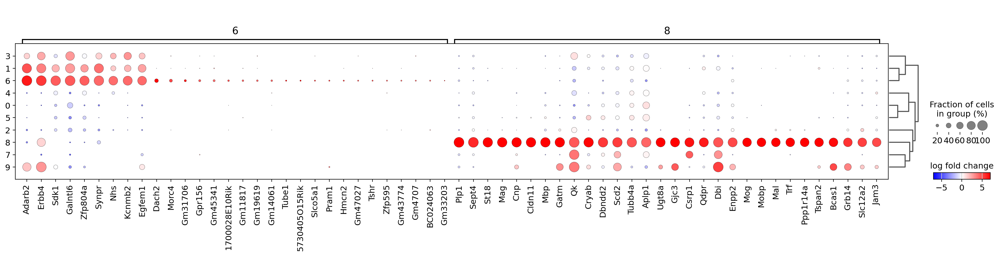

In [66]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    n_genes=30,
    values_to_plot="logfoldchanges",
    min_logfoldchange=4,
    vmax=7,
    vmin=-7,
    cmap="bwr",
    groups=["6", "8"],
)

### Visualize marker genes using stacked violin plots

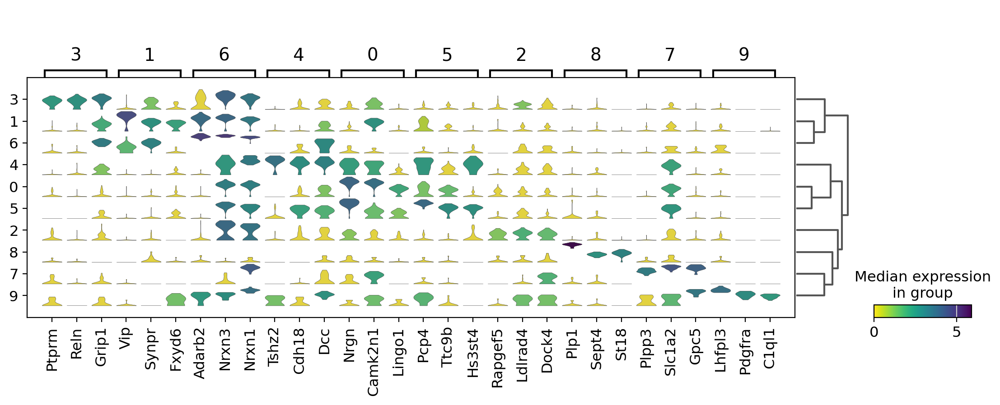

In [67]:
sc.pl.rank_genes_groups_stacked_violin(adata, n_genes=3, cmap="viridis_r")

### Visualize marker genes using tracksplot

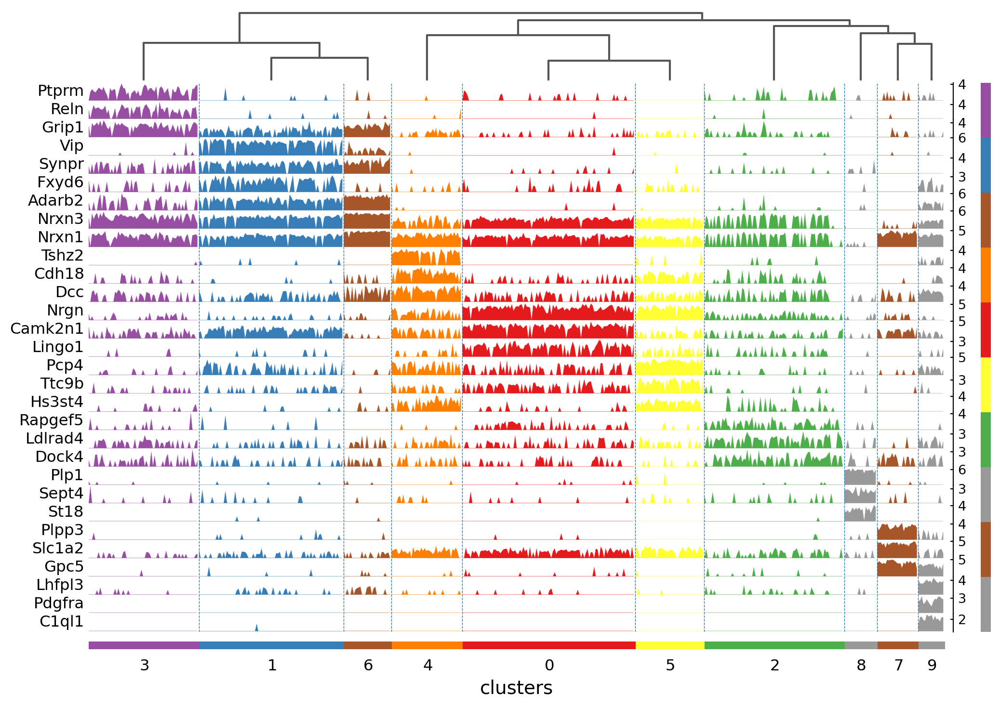

In [68]:
sc.pl.rank_genes_groups_tracksplot(adata, n_genes=3)

## Comparison of marker genes using split violin plots
In scanpy, is very easy to compare marker genes using split violin plots for all groups at once.

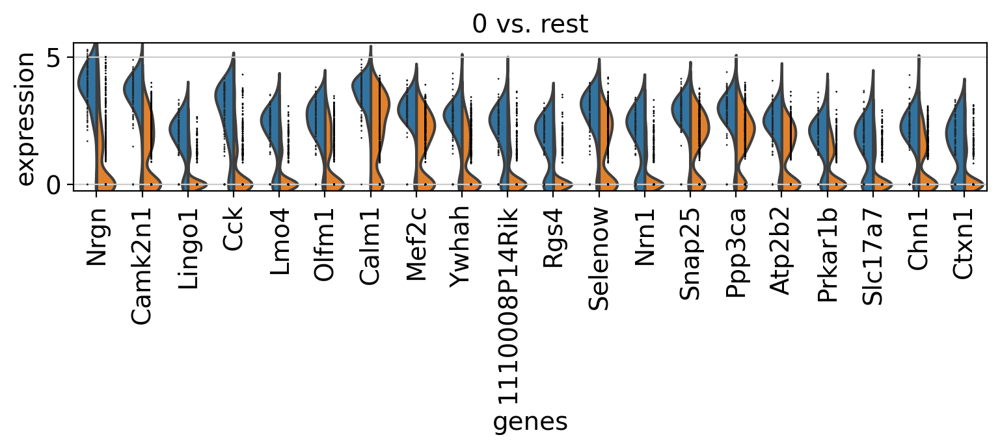

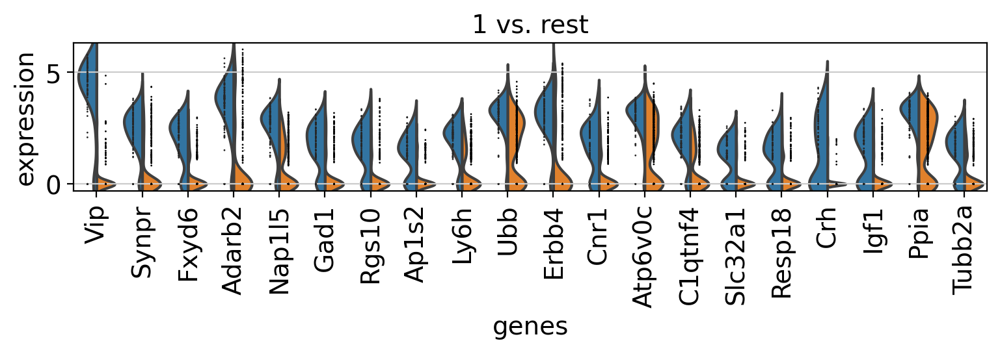

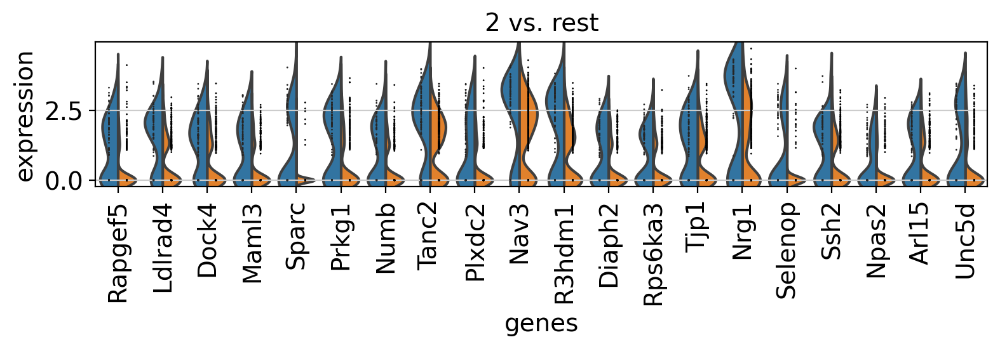

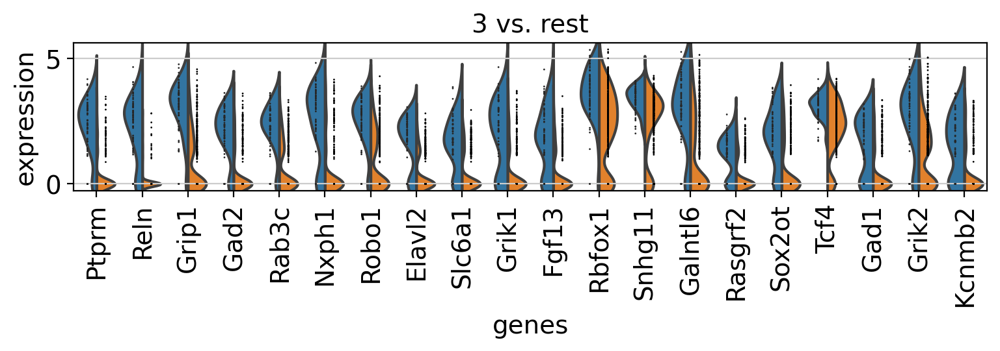

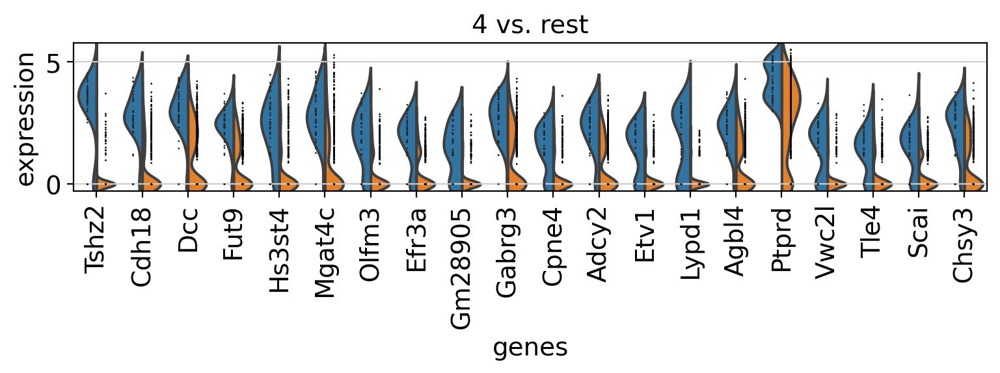

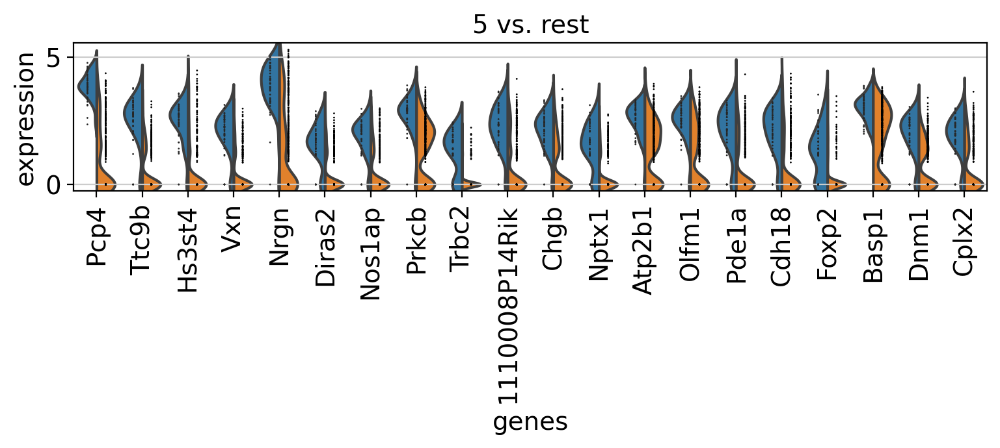

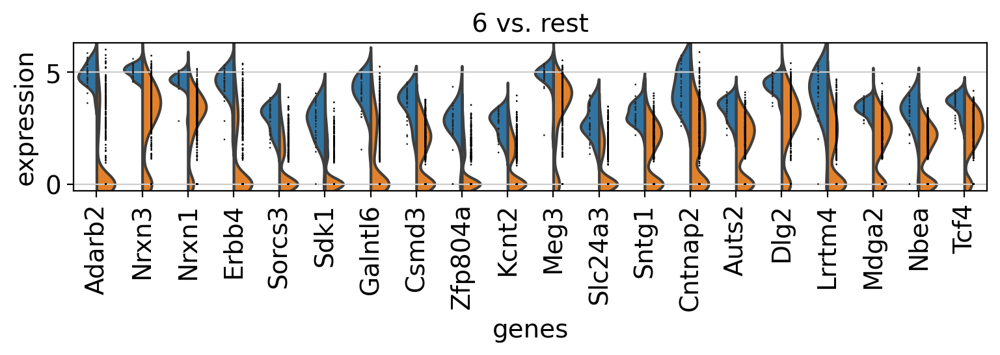

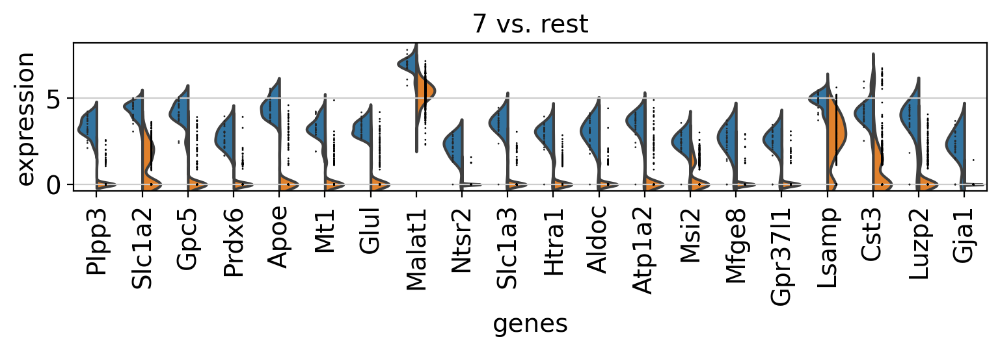

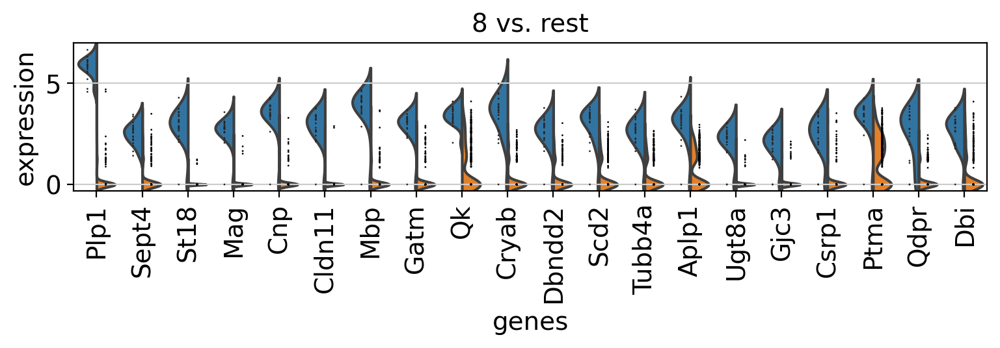

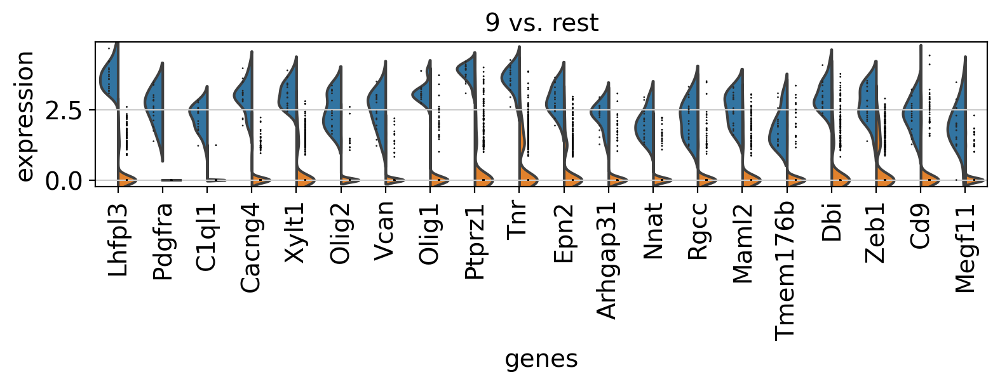

In [69]:
with rc_context({"figure.figsize": (9, 1.5)}):
    sc.pl.rank_genes_groups_violin(adata, n_genes=20, jitter=False)

## Dendrogram options

Most of the visualizations can arrange the categories using a dendrogram. However, the dendrogram can also be plotted independently as follows:

In [70]:
# compute hierarchical clustering using PCs (several distance metrics and linkage methods are available).
sc.tl.dendrogram(adata, "clustered")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clustered']`


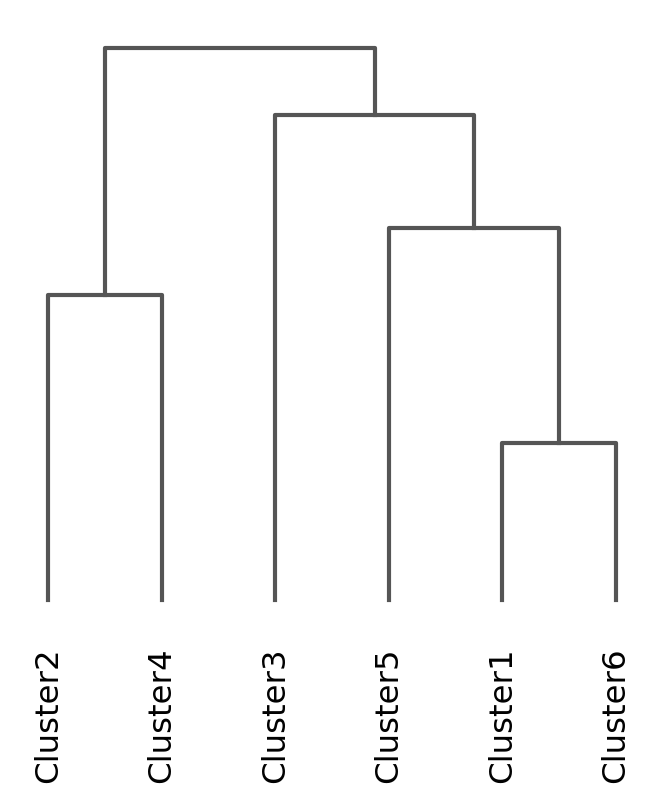

In [71]:
ax = sc.pl.dendrogram(adata, "clustered")

## Plot correlation

Together with the dendrogram it is possible to plot the correlation (by default 'pearson') of the categories.

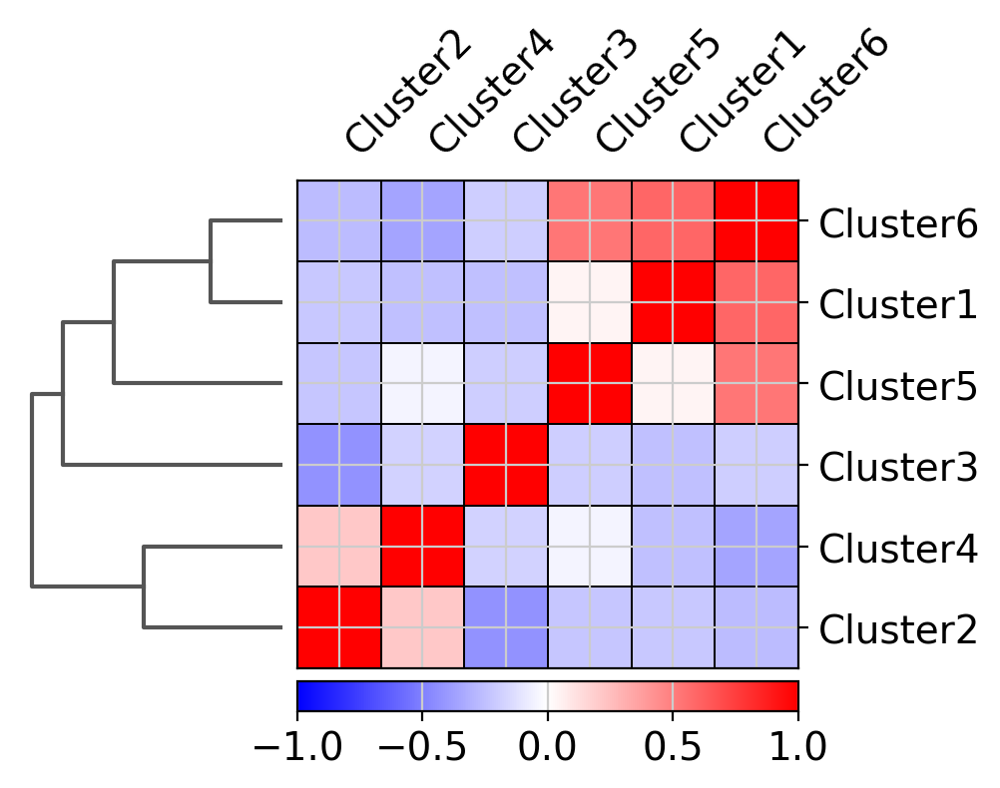

In [72]:
ax = sc.pl.correlation_matrix(adata, "clustered", figsize=(5, 3.5))



# Save Results

In [73]:
adata

AnnData object with n_obs × n_vars = 520 × 3978
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'clusters', 'clustered'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap', 'clusters_colors', 'dendrogram_clusters', 'dendrogram_clustered', 'clustered_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [74]:
adata.write(
    results_file, compression="gzip"
)  # `compression="gzip"` saves disk space, but slows down writing and subsequent reading

If you want to share this file with people who merely want to use it for visualization, a simple way to reduce the file size is by removing the dense scaled and corrected data matrix. The file still contains the raw data used in the visualizations in `adata.raw`.

In [75]:
adata.raw.to_adata().write(f"{results_dir}/write/INCF_withoutX.h5ad")